## Diagnose Diabetes with Predictive Modelling

By: Group 5 (Jessie Liang, Zili Ding, Han Qin, Ethan Wang) using Dataset 4 (Diabetes)

In [3]:
# Main developer: Jessie Liang
# Contributor: Zili Ding (edit)

# loading packages
library(tidyverse)
library(GGally)
library(ggplot2)
library(gridExtra)
library(caret)
library(pROC)
library(glmnet)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2


Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine


Loading required package: lattice


Attaching package: ‘caret’


The following object is masked from ‘package:purrr’:

    lift


Type 'citation("pROC")' for a citation.


Attaching package: ‘pROC’


The following objects are masked from ‘package:stats’:

    cov, smooth, var


Loading requir

### (1) Introduction

#### 1.1 Background Information

Nowadays, diabetes is a relatively common disease which can happen to people of all ages. As research points out, there are four broad types of diabetes: 
1. **Type 1 diabetes:** caused by autoimmune beta-cell destruction 
2. **Type 2 diabetes:** caused by insulin resistance 
3. **Diabetes due to other causes:** such as monogenic diabetes syndrome 
4. **Gestational diabetes mellitus:** occuring during pregnancy 

(American Diabetes Association, 2021)

Although extensive research has deepened our understanding of diabetes, the current situation leaves little room for optimism. According to Cowie (2019), the incidence of diagnosed diabetes has been steadily rising. Moreover, our existing medical technology is not advanced enough to confidently diagnose all diabetes cases. Alarmingly, in the US, about a quarter to a third of diabetes cases go undiagnosed, with young people making up the largest proportion of these undetected cases (Cowie, 2019).

Given the prevalence of diabetes and the shortcomings in current technology, it's crucial for us to develop new methods to bridge this gap. Beyond biological approaches, statistical methods can also play a significant role in diagnosis by leveraging data. This project aims to explore such data-driven solutions.

#### 1.2 Research Question

How to use physiological indicators to predict whether an adult female patient (over 21 years old) of Pima Indian heritage has diabetes?

#### 1.3 Dataset Description

##### Reading Data

In [4]:
# Main developer: Jessie Liang
# Contributor: Zili Ding (change position)

diabetes <- read.csv("diabetes.csv")
head(diabetes)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<int>
1,6,148,72,35,0,33.6,0.627,50,1
2,1,85,66,29,0,26.6,0.351,31,0
3,8,183,64,0,0,23.3,0.672,32,1
4,1,89,66,23,94,28.1,0.167,21,0
5,0,137,40,35,168,43.1,2.288,33,1
6,5,116,74,0,0,25.6,0.201,30,0


In [24]:
# Main developer: Zili Ding
# Contributor: Jessie Liang(some suggestions)

num_observations <- nrow(diabetes)
num_variables <- ncol(diabetes)
count_response <- data.frame(
  Outcome = count(diabetes,Outcome)$Outcome,
  number = count(diabetes,Outcome)$n
)

variable_info <- data.frame(
  Name = names(diabetes),
  Type = sapply(diabetes, class)
)

cat("Dataset Summary:\n")
cat("Number of observations:", num_observations, "\n")
cat("Number of variables:", num_variables, "\n")
cat("\nVariable Information:\n")
print(variable_info)
cat("\nCountings of Response Variable:\n")
print(count_response)

Dataset Summary:
Number of observations: 768 
Number of variables: 9 

Variable Information:
                                             Name    Type
Pregnancies                           Pregnancies integer
Glucose                                   Glucose integer
BloodPressure                       BloodPressure integer
SkinThickness                       SkinThickness integer
Insulin                                   Insulin integer
BMI                                           BMI numeric
DiabetesPedigreeFunction DiabetesPedigreeFunction numeric
Age                                           Age integer
Outcome                                   Outcome integer

Countings of Response Variable:
  Outcome number
1       0    500
2       1    268


##### Data Source

This dataset is collected by the National Institute of Diabetes and Digestive and Kidney Diseases. It is filtered from a larger database, specifically focusing on female patients who are at least 21 years old of Pima Indian heritage. The goal is to diagnose diabetes status for new patients using several physiological measurements in a data-driven way.

##### Dimension of the Dataset

The dataset contains 768 rows and 9 columns, including 1 response variable and 8 potential predictors. Note that there are no missing values in any of the rows.

- Variable Descriptions

| Variable                   | Type    | Description                                 |
|----------------------------|---------|---------------------------------------------|
| **Pregnancies**            | Integer | Number of pregnancies.                      |
| **Glucose**                | Integer | Glucose level in blood.                     |
| **BloodPressure**          | Integer | Blood pressure measurement.                 |
| **SkinThickness**          | Integer | Thickness of the skin.                      |
| **Insulin**                | Integer | Insulin level in blood.                     |
| **BMI**                    | Float   | Body mass index.                            |
| **DiabetesPedigreeFunction** | Float | Diabetes pedigree function (genetic factor).|
| **Age**                    | Integer | Age of the patient.                         |
| **Outcome**                | Integer | Diabetes diagnosis result (1: Yes, 0: No).  |

### (2) Methods and Results

#### (a) Exploratory Data Analysis (EDA)

#### a.1 Cleaning and Tidying Data

To prepare for modelling later, we first drop `NA` values in the original dataset. After that, the dataset is already in a tidy format which does not require any further processing.

In [6]:
# Main developer: Jessie Liang

diabetes <- drop_na(diabetes)

#### a.2 Plotting Raw Data

##### **Plot 1: Boxplot to Explore Variable Effectiveness**

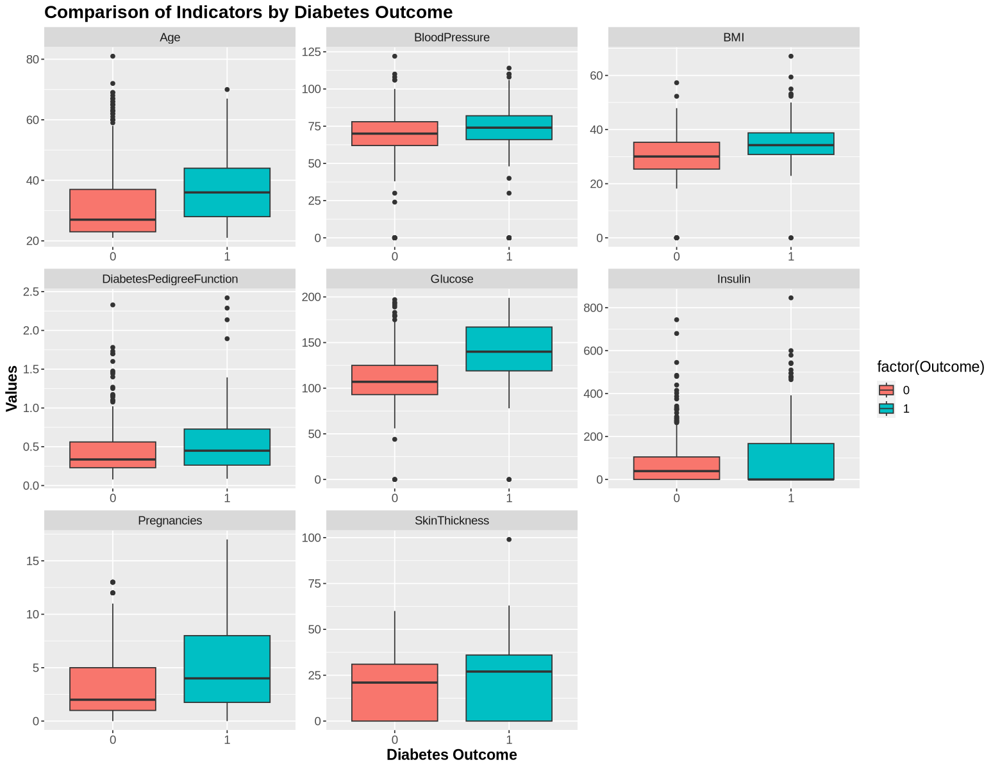

In [22]:
# Main developer: Ethan Wang

diabetes_plot <- diabetes %>%
    gather(key = "variable", value = "value", Glucose, BloodPressure, SkinThickness, Insulin, BMI, 
           Pregnancies, DiabetesPedigreeFunction, Age)

diabetes_box <- diabetes_plot %>%
    ggplot() +
    geom_boxplot(aes(x = factor(Outcome), y = value, fill = factor(Outcome))) +
    facet_wrap(~ variable, scales = "free") +
    ggtitle("Comparison of Indicators by Diabetes Outcome") +
    xlab("Diabetes Outcome") +
    ylab("Values") +
    theme(
        text = element_text(size = 14),
        plot.title = element_text(face = "bold"),
        axis.title = element_text(face = "bold")
    )

options(repr.plot.width=13, repr.plot.height=10)

diabetes_box

**Comment:** The boxplots shows the distribution of indicators for diabetic and non-diabetic patients (1: Yes, 0: No). It is a helpful way to explore the effectiveness of each variable and observe outliers that may need to be removed. Variables that show a clear seperation between these two groups would be stronger indicators. In this case, Glucose and Age seems to be key predictors. Additionally, the prescence of outliers in many of these variables also shows the need for potential data pre-processing.  

##### **Plot 2: ggpairs Plot to Explore Multicollinearity**

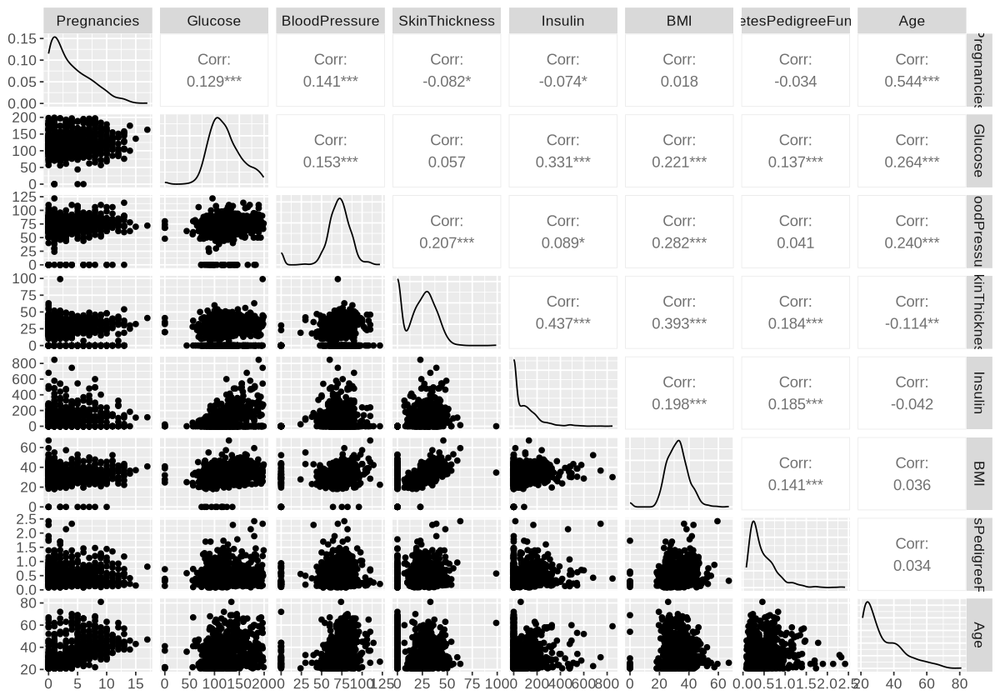

In [9]:
# Main developer: Jessie Liang

options(repr.plot.width = 10, repr.plot.height = 7)
diabetes_pair_plots <- 
  diabetes %>%
  select(- Outcome) %>% 
  ggpairs(progress = FALSE) +
  theme(text = element_text(size = 13))
diabetes_pair_plots

##### **Plot 3: Heat Map to Explore Multicollinearity**

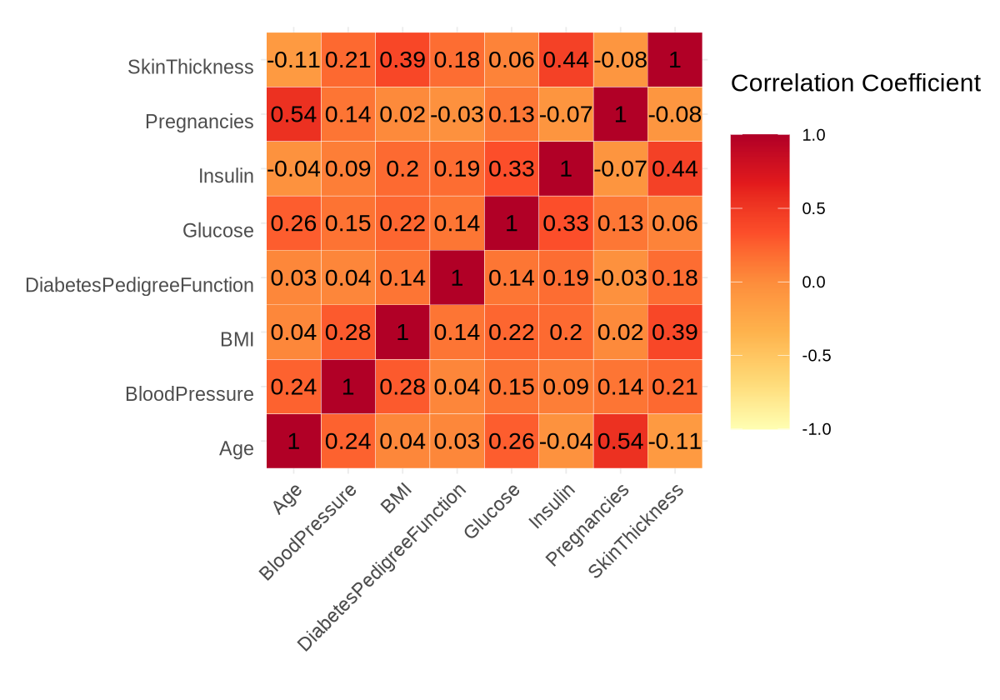

In [6]:
# Main developer: Jessie Liang

options(repr.plot.width = 10, repr.plot.height = 7)
corr_matrix_diabetes <- 
   diabetes %>%
   select(- Outcome) %>% 
   cor() %>%
   as_tibble(rownames = 'var1') %>%
   pivot_longer(-var1, names_to = "var2", values_to = "corr")

plot_corr_matrix_diabetes <- 
  corr_matrix_diabetes %>%
  ggplot(aes(var1, var2)) +
  geom_tile(aes(fill = corr), color = "white") +
  scale_fill_distiller("Correlation Coefficient \n",
      palette =  "YlOrRd",
      direction = 1, 
      limits = c(-1, 1)
    ) +
    labs(x = "", y = "") +
    theme_minimal() +
    theme(
        axis.text.x = element_text(angle = 45, vjust = 1, size = 14, hjust = 1),
        axis.text.y = element_text(vjust = 1, size = 14, hjust = 1),
        legend.title = element_text(size = 18),
        legend.text = element_text(size = 12),
        legend.key.size = unit(1.5, "cm")
    ) +
    coord_fixed() +
  geom_text(aes(var1, var2, label = round(corr, 2)), color = "black", size = 6)

plot_corr_matrix_diabetes

**Comment**: Exploring multicollinearity is a helpful first step to get insights of the data structure, and may provide some guidance for variable selection later. According to the heatmap, multicollinearity is not a severe issue in this dataset. The highest correlation between different covariates is only 0.54, which is moderate.

##### **Plot 4: Empirical Logit Plot to Explore Association**

In [10]:
# Main developer: Nicole Dalzell, Associate Teaching Professor, Wake Forest University.
# Contributor: Jessie Liang (cited this code from Nicole's book)

logOddsPlot <- function(x, y, xname, formulahere){
  sort = order(x)
  x = x[sort]
  y = y[sort]
  a = seq(1, length(x), by=.05*length(y))
  b = c(a[-1] - 1, length(x))
  
  prob = xmean = ns = rep(0, length(a)) # ns is for CIs
  for (i in 1:length(a)){
    range = (a[i]):(b[i])
    prob[i] = mean(y[range])
    xmean[i] = mean(x[range])
    ns[i] = b[i] - a[i] + 1 # for CI 
  }
  
  extreme = (prob == 1 | prob == 0)
  prob[prob == 0] = .01
  prob[prob == 1] = .99
  
  g = log(prob/(1-prob))
  
  dataHere <- data.frame("x" = b, "LogOdds" = g)
  
  suppressMessages(library(ggplot2))
  
  ggplot(dataHere, aes(x =xmean, y = LogOdds)) + geom_point() + geom_smooth(formula = formulahere, method = "lm", se = FALSE) + labs(x = xname, y = "Log Odds")
}

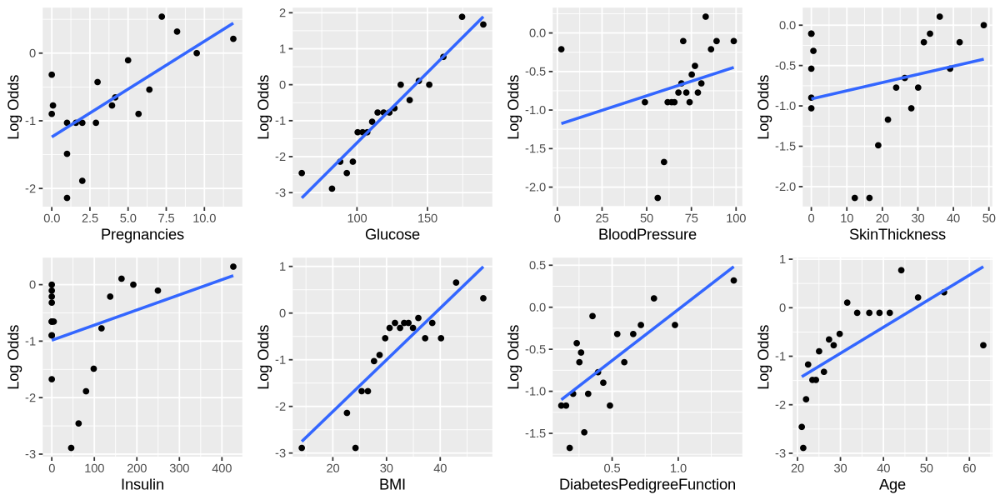

In [11]:
# Main developer: Jessie Liang

options(repr.plot.width = 10, repr.plot.height = 5)
plot1 <- logOddsPlot(diabetes$Pregnancies, diabetes$Outcome, "Pregnancies", y~x)
plot2 <- logOddsPlot(diabetes$Glucose, diabetes$Outcome, "Glucose", y~x)
plot3 <- logOddsPlot(diabetes$BloodPressure, diabetes$Outcome, "BloodPressure", y~x)
plot4 <- logOddsPlot(diabetes$SkinThickness, diabetes$Outcome, "SkinThickness", y~x)
plot5 <- logOddsPlot(diabetes$Insulin, diabetes$Outcome, "Insulin", y~x)
plot6 <- logOddsPlot(diabetes$BMI, diabetes$Outcome, "BMI", y~x)
plot7 <- logOddsPlot(diabetes$DiabetesPedigreeFunction, diabetes$Outcome, "DiabetesPedigreeFunction", y~x)
plot8 <- logOddsPlot(diabetes$Age, diabetes$Outcome, "Age", y~x)
grid.arrange(plot1, plot2, plot3, plot4, plot5, plot6, plot7, plot8, nrow = 2)

One of the assumptions of logistic regression is the linear relationship between logit and the numerical variables. To check for linearity, we plot the empirical logit versus each numerical variable using the data. 

From the above logit plots, we can make the following comments:

- the logit plot looks roughly linear for `Pregnancies`, `Glucose`,`BMI` and `DiabetesPedigreeFunction`. For these variables, it is reasonble to fit a linear function of them to model the logit.

- the linear relationship is moderately violated for `BloodPressure` since there are a few outliers.

- the logit plot deviates a lot from being linear for `SkinThickness`, `Insulin` and `Age` as the data points show a curve pattern instead of being linearly scattered. If we do need to include those variables in our model later, probably variable transformation or using polynomials is a good choice.

However, for simplicity, we will include only the linear terms of predictors since a simpler model is preferable when the performance is roughly the same.

#### a.4 Summary Table

##### **Table 1: Correlation Table Between Predictors and Empirical Logit**

In [16]:
# Main developer: Jessie Liang (based on the code above and modify a bit)

correlationWithLogit <- function(x, y){
  sort = order(x)
  x = x[sort]
  y = y[sort]
  a = seq(1, length(x), by=.05*length(y))
  b = c(a[-1] - 1, length(x))
  
  prob = xmean = ns = rep(0, length(a)) # ns is for CIs
  for (i in 1:length(a)){
    range = (a[i]):(b[i])
    prob[i] = mean(y[range])
    xmean[i] = mean(x[range])
    ns[i] = b[i] - a[i] + 1 # for CI 
  }
  
  extreme = (prob == 1 | prob == 0)
  prob[prob == 0] = .01
  prob[prob == 1] = .99
  
  g = log(prob/(1-prob))
  
  dataHere <- data.frame("x" = b, "LogOdds" = g)
  
  suppressMessages(library(ggplot2))
    
  return(cor(dataHere$x, dataHere$LogOdds))
  
}

In [17]:
# Main developer: Jessie Liang

predictor <- c("Pregnancies", "Glucose", "BloodPressure", "SkinThickness", 
               "Insulin", "BMI", "DiabetesPedigreeFunction", "Age")
correlation_with_logit <- c(correlationWithLogit(diabetes$Pregnancies, diabetes$Outcome),
                            correlationWithLogit(diabetes$Glucose, diabetes$Outcome),
                            correlationWithLogit(diabetes$BloodPressure, diabetes$Outcome),
                            correlationWithLogit(diabetes$SkinThickness, diabetes$Outcome),
                            correlationWithLogit(diabetes$Insulin, diabetes$Outcome),
                            correlationWithLogit(diabetes$BMI, diabetes$Outcome),
                            correlationWithLogit(diabetes$DiabetesPedigreeFunction, diabetes$Outcome),
                            correlationWithLogit(diabetes$Age, diabetes$Outcome))
correlation_table <- data.frame(predictor, correlation_with_logit)
correlation_table

predictor,correlation_with_logit
<chr>,<dbl>
Pregnancies,0.6222334
Glucose,0.9587280
BloodPressure,0.6160509
SkinThickness,0.3000331
Insulin,0.1112644
BMI,0.8597795
DiabetesPedigreeFunction,0.7179573
Age,0.8644806


**Comment**: Out of the eight covariates, `Glucose`, `BMI` and `Age` are highly associated with the logit. `Pregnancies`, `BloodPressure` and `DiabetesPedigreeFunction` are moderately associated with the logit. `SkinThickness` and `Insulin` are weakly associated with the logit.

##### **Table 2: Count of Each Category**

In [18]:
# Main developer: jessie Liang

diabetes %>%
    group_by(Outcome) %>%
    summarise(n = n())

Outcome,n
<int>,<int>
0,500
1,268


**Comment**: There are roughly twice as many healthy people as diabetes patients in the original dataset. So our dataset is imbalanced, this suggests that using the g-mean as a metric when selecting thresholds later could be beneficial.

##### **Table 3: Data Summary Table for each Predictor**

In [19]:
# Main developer: Jessie Liang

diabetes %>%
    select(- Outcome) %>%
    summary()

  Pregnancies        Glucose      BloodPressure    SkinThickness  
 Min.   : 0.000   Min.   :  0.0   Min.   :  0.00   Min.   : 0.00  
 1st Qu.: 1.000   1st Qu.: 99.0   1st Qu.: 62.00   1st Qu.: 0.00  
 Median : 3.000   Median :117.0   Median : 72.00   Median :23.00  
 Mean   : 3.845   Mean   :120.9   Mean   : 69.11   Mean   :20.54  
 3rd Qu.: 6.000   3rd Qu.:140.2   3rd Qu.: 80.00   3rd Qu.:32.00  
 Max.   :17.000   Max.   :199.0   Max.   :122.00   Max.   :99.00  
    Insulin           BMI        DiabetesPedigreeFunction      Age       
 Min.   :  0.0   Min.   : 0.00   Min.   :0.0780           Min.   :21.00  
 1st Qu.:  0.0   1st Qu.:27.30   1st Qu.:0.2437           1st Qu.:24.00  
 Median : 30.5   Median :32.00   Median :0.3725           Median :29.00  
 Mean   : 79.8   Mean   :31.99   Mean   :0.4719           Mean   :33.24  
 3rd Qu.:127.2   3rd Qu.:36.60   3rd Qu.:0.6262           3rd Qu.:41.00  
 Max.   :846.0   Max.   :67.10   Max.   :2.4200           Max.   :81.00  

**Comment**: These eight predictors are on different scales, with some less than 1, some larger than 100. In other to perform LASSO selection later, it is necessary to standardize these variables first. Fortunately, the glmnet function will handle this automatically for us.

#### (b) Methods: Plan

#### b.1 Model Selection

**Method Description**: Since LASSO method can do variable selection by shrinking some coefficients to zero, here we adopt the LASSO method to develop a reduced model that performs well in prediction.

**Steps**:

- Split the original dataset into a training set and a test set
- Use cross validation to choose an appropriate value of $\lambda$
- Fit the LASSO model on the training set using the selected $\lambda$ to identify key variables

**Step 1**: We randomly split the original dataset into a training set and a test set using `slice_sample()` and `antijoin()`. The training set includes 70% of the observations and the rest 30% make up the testing set. As a result, there are 537 data points in `diabetes_train` and 231 observations in `diabetes_test`, respectively.

In [15]:
# Main developer: Jessie Liang

set.seed(301)
diabetes <- diabetes %>% mutate(ID = seq.int(nrow(diabetes)))
diabetes_train <- diabetes %>% slice_sample(prop = 0.70)
diabetes_test <- diabetes %>% anti_join(diabetes_train, by = "ID")
diabetes_train <- 
    diabetes_train %>% 
    select(-ID)
diabetes_test <- 
    diabetes_test %>% 
    select(-ID)
tail(diabetes_train, 3)
tail(diabetes_test, 3)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<int>
535,1,91,64,24,0,29.2,0.192,21,0
536,7,124,70,33,215,25.5,0.161,37,0
537,3,111,62,0,0,22.6,0.142,21,0


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<int>
229,1,121,78,39,74,39.0,0.261,28,0
230,8,154,78,32,0,32.4,0.443,45,1
231,1,128,88,39,110,36.5,1.057,37,1


The functions in `glmnet` package requires an input of type matrix, so we need to transform the data frames into matrices before using those functions.

In [16]:
# Main developer: Jessie Liang

matrix_X_train <- 
    diabetes_train %>%
    select(-Outcome) %>%
    as.matrix()
matrix_Y_train <- 
    diabetes_train %>%
    select(Outcome) %>%
    as.matrix(ncol = 1)
matrix_X_test <- 
    diabetes_test %>%
    select(-Outcome) %>%
    as.matrix()
matrix_Y_test <- 
    diabetes_test %>%
    select(Outcome) %>%
    as.matrix(ncol = 1)

**Step 2**: The LASSO method requires selecting the $\lambda$ value in advance. To do this, we use 10-fold cross validation. The output below produces the $\lambda$ value with maximum AUC and also the largest $\lambda$ value whose AUC is within one standard error of the maximum AUC. As discussed before, we prefer a simpler model, which is why we choose `lambda.1se` as our final value of $\lambda$.

In [17]:
# Main developer: Jessie Liang

set.seed(301)
diabetes_cv_LASSO <- 
  cv.glmnet(
  x = matrix_X_train, 
  y = matrix_Y_train,
  alpha = 1,
  family = "binomial",
  type.measure = "auc",
  nfolds = 10)
diabetes_cv_LASSO


Call:  cv.glmnet(x = matrix_X_train, y = matrix_Y_train, type.measure = "auc",      nfolds = 10, alpha = 1, family = "binomial") 

Measure: AUC 

     Lambda Index Measure      SE Nonzero
min 0.00946    35  0.8393 0.01354       7
1se 0.05542    16  0.8263 0.01115       4

In [18]:
# Main developer: Jessie Liang

lambda_1se <- round(diabetes_cv_LASSO$lambda.1se, 4)
lambda_1se

[1] 0.0554

##### **Plot 4: Relationship Between AUC versus Log($\lambda$)**

In [20]:
# Main developer: Jessie Liang

options(repr.plot.width = 10, repr.plot.height = 7) # Adjust these numbers so the plot looks good in your desktop.
plot(diabetes_cv_LASSO, main = "Cross-Validation with LASSO\n\n")

ERROR: Error in plot(diabetes_cv_LASSO, main = "Cross-Validation with LASSO\n\n"): object 'diabetes_cv_LASSO' not found


From the above graph, we can see that if we choose `lambda.1se`, the model uses only 4 predictors. On the contrary, the model includes 7 predictors when we choose `lambda.min`. Since the preformance does not differ a lot, we prefer a smaller model for simplicity. Therefore, we choose to use lambda.1se.

**Step 3**: After deciding the $\lambda$ value to use, we fit the LASSO model using the training set. As shown in the model output, only `Glucose`, `BMI`, `DiabetesPedigreeFunction` and `Age` are included in the final predictive model.

In [20]:
# Main developer: Jessie Liang

set.seed(301)
model <- glmnet(
  x = matrix_X_train, y = matrix_Y_train,
  alpha = 1,
  family = "binomial",
  lambda = lambda_1se
)

model
coef(model)


Call:  glmnet(x = matrix_X_train, y = matrix_Y_train, family = "binomial",      alpha = 1, lambda = lambda_1se) 

  Df  %Dev Lambda
1  4 21.94 0.0554

9 x 1 sparse Matrix of class "dgCMatrix"
                                  s0
(Intercept)              -5.02926502
Pregnancies               .         
Glucose                   0.02349243
BloodPressure             .         
SkinThickness             .         
Insulin                   .         
BMI                       0.02739425
DiabetesPedigreeFunction  0.06504136
Age                       0.01535176

#### b.2 Model Assessment

**Method Description**: Since the response is binary, it is not appropriate to use MSE for model assessment. Instead, we will display a confusion matrix and an ROC curve with an AUC value on it. Note that we will apply the selected model to the test set to evaluate its out-of-sample prediction performance, which is our primary concern.

**Caveat**: A model for prediction alone is not enough to tell us how to predict diabetes. The model will only return a probability of having diabetes. We still need to pick a threshold value for classification, under which we classify the person as "not having diabetes" and above which we classify the person as "having diabetes". With both the model and the threshold at hand, we will have all the information needed to make predictions.

**Steps**:

- Pick a threshold that yields the highest g-mean value
- Produce the confusion matrix of the LASSO model using the selected threshold
- Plot the ROC curve with an AUC value

**Step 1**: We iterate through 1000 possible thresholds between 0 and 1, calculating the g-mean for each threshold. Then we pick the threshold that maximizes the g-mean value. As the result turns out, the chosen threshold is 0.354, so we will classify a person as having diabetes if the predicted probability is at least 0.354. Here, g-mean is defined as sqrt(sensitivity*specificity). We choose g-mean as a metric because optimizing it balances sensitivity and specificity in imbalanced classification problems (Brownlee, 2020). Given that our dataset has roughly twice as many healthy individuals as diabetes patients, it is indeed imbalanced, so it justifies our use of g-mean.

In [21]:
# Main developer: Jessie Liang

max = -1000
best_threshold = 0
for (i in 1:1000) {
    threshold = i/1000
    prediction <- if_else(predict(model,matrix_X_test,type = "response")[,"s0"] >= threshold, 1, 0)
    sens = sensitivity(as.factor(prediction), as.factor(diabetes_test$Outcome))
    spec = specificity(as.factor(prediction), as.factor(diabetes_test$Outcome))
    gmean = sqrt(sens * spec)
    if (gmean > max) {
        max = gmean
        best_threshold = threshold
    }
}
cat("the best threshold with highest g-mean is: ", best_threshold)

the best threshold with highest g-mean is:  0.354

**Step 2**: We first compute the predicted class for the test set using the threshold selected above. Then we produce the confusion matrix using `confusionMatrix()`.

In [22]:
# Main developer: Jessie Liang

prediction <- if_else(predict(model,matrix_X_test,type = "response")[,"s0"] >= best_threshold, 1, 0)
confusion_matrix <- 
    confusionMatrix(
        data = as.factor(prediction),
        reference = as.factor(diabetes_test$Outcome),
        positive = "1")

confusion_matrix

Confusion Matrix and Statistics

          Reference
Prediction   0   1
         0 106  27
         1  35  63
                                          
               Accuracy : 0.7316          
                 95% CI : (0.6696, 0.7876)
    No Information Rate : 0.6104          
    P-Value [Acc > NIR] : 7.331e-05       
                                          
                  Kappa : 0.4446          
                                          
 Mcnemar's Test P-Value : 0.374           
                                          
            Sensitivity : 0.7000          
            Specificity : 0.7518          
         Pos Pred Value : 0.6429          
         Neg Pred Value : 0.7970          
             Prevalence : 0.3896          
         Detection Rate : 0.2727          
   Detection Prevalence : 0.4242          
      Balanced Accuracy : 0.7259          
                                          
       'Positive' Class : 1               
                              

In [23]:
# Main developer: Jessie Liang

precision <- round(63/(63 + 35), 4)
precision

[1] 0.6429

**Analysis of the confusion matrix**: The sensitivity is 70%, which means that our model and threshold can diagnose 70% of diabetes patients, with 30% unclassified. As mentioned above, current medical technologies leave a quarter to a third of diabetes patients unclassified. So it seems that our model does not provide a much better classifier than what are being used right now. Although our model is not perfect, with an overall accuracy of 73.16%, it still performs reasonably well, and both sensitivity and specificity are fairly high.

**Step 3**: The next code block constructs an `roc` object with predictions of the test set using the selected model. We can plot the ROC curve based on the test set as follows.

##### **Plot 5: ROC curve for Diabetes Diagnosis**

Setting levels: control = 0, case = 1

Setting direction: controls < cases



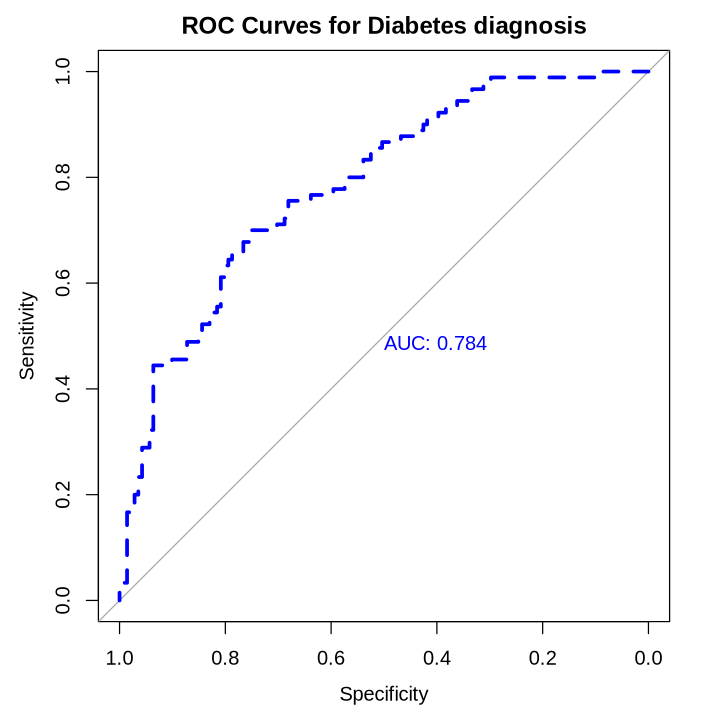

In [24]:
# Main developer: Jessie Liang

myROC <- 
    roc(
        response = diabetes_test$Outcome,
        predictor = predict(model,
                     newx = matrix_X_test)[,"s0"])

options(repr.plot.width = 6, repr.plot.height = 6) 
plot(myROC,
  print.auc = TRUE, col = "blue", lwd = 3, lty = 2,
  main = "ROC Curves for Diabetes diagnosis"
)

**Analysis of ROC curve**: This ROC curve yields an AUC of 0.784. In general, the higher the AUC, the better is our classifier. 0.784 is between medium and high, so our model does a decent job in predicting, though not perfect.

### (3) Discussion

#### 3.1 Interpret the Results Obtained with Respect to the Main Question/Goal of this Project

Our main question of this project is: How to use physiological indicators to predict whether an adult female patient of Pima Indian heritage has diabetes? After doing data modelling and analysis, we can give an answer to this question. i.e. Using the LASSO model obtained above and a classification threshold of 0.354, we can predict an unseen person's health state. Specifically, we input the values of those 8 covariates, then use the LASSO model to predict the probability of having diabetes. If this probability is at least 0.354, then we predict the person as having diabetes, or predict him/her as healthy otherwise.

This classification method is correct 73.16% of the time. Among all diabetes patients, our classifier can identify them as having diabetes 70% of the time. Among all healthy individuals, our classifier can identify them as healthy 75.18% of the time. Conditioning on a positive prediction by our classifier, the probability for a person to actually have diabetes is 64.29%.

#### 3.2 Summarize what was Found and the Implications/Impact of the Findings

**Summary**: 

- By using the LASSO method, `lambda.1se` has a value of 0.0554, resulting in a final predictive includes only 4 variables, namely `Glucose`, `BMI`, `DiabetesPedigreeFunction` and `Age`.
- The best threshold used for classification that maximizes the g-mean is 0.354.
- Using the model and threshold selected, our classifier has an overall accuracy of 73.16%, a sensitivity of 70%, a specificity of 75.18% and a Kappa of 0.4446.
- The ROC curve has an AUC value of 0.784.

**Implications/Impact**:

- This project approaches to diabetes diagnosis in a completly data-driven way, which may inspire other scientists to adopt a similar method for detecting other existing diseases, opening a new direction for disease diagnosis.
- Although the classifier in this project does a decent job, it is still far from perfect. This leaves rooms for improvement For example, our project may encourage other scientists to find new possible predictors other than these eight covariates in the `diabetes` dataset. With many people's joint efforts, there is hope for improving the accuracy of diabetes diagnosis in reality and reduce the number of undiagnosed cases.

#### 3.3 Discuss Whether your Results were what you Expected to Find

- The coefficients in the final LASSO model meet our expectations. Based on medical information, the level of glucose, BMI, the degree of family diabetes history and age are all positivly associated with the probability of having diabetes. In our LASSO model, all four slope coefficients are positive, which is exactly what we expected.
- Initially we hoped to obtain a model that will be highly accurate, sensitive and specific. But in the end, the best we can do is roughly 70% accurate, sensitive and specific. This result does not significantly improve current diabetes diagnosis, which is a bit disappointing as this aspect did not meet our initial expectations.

#### 3.4 Discuss how your Model could be Improved

- Based on the empirical logit plots, not all varialbes are linearly associated with logit. Therefore, one way to improve the model is to apply polynomial transformation of some covariates. In other words, the right hand side of the logistic model is not a linear function, but a polynomial. This way of transformation may improve the accuracy, sensitivity and specificity.
- The original dataset only contains 8 possible predictors and there might be other relevant ones. Another way of improving the model is to search for some other predictors that might be helpful. Incorporating other relevant variables into our analysis might boost our model performance.

#### 3.5 Discuss Future Questions/Research this Study could Lead to

- What are the possible covariates related to diabetes diagnosis other than those eight included in the `diabetes` dataset?
- What transformation of covariates is suitable to improve the model performance in this project, if any?
- What other diseases can be diagnosed by this data-driven way?
- How do the predictors and model effectiveness compare across different ethnic and demographic groups, and can this research be extended to other populations?

### (4) References

American Diabetes Association. (2021). Classification and diagnosis of diabetes: Standards of medical care in diabetes—2021. Diabetes Care, 44(Supplement 1), S15–S33. https://doi.org/10.2337/dc21-s002

Brownlee, J. (2020, February 9). A Gentle Introduction to Threshold-Moving for Imbalanced Classification. Machine Learning Mastery. https://machinelearningmastery.com/threshold-moving-for-imbalanced-classification/

Cowie, C. C. (2019). Diabetes Diagnosis and Control: Missed Opportunities to Improve Health. Diabetes Care, 42(6), 994–1004. https://doi.org/10.2337/dci18-0047

Nicole Dalzell, Associate Teaching Professor, Wake Forest University. (2024). Chapter 6 Logistic Regression | Statistical Coding Dictionary. In bookdown.org. https://bookdown.org/dalzelnm/bookdown-demo/logistic-regression.html#creating-an-empirical-logit-plot